In [1]:
import scanpy
import scanpy.api as sc
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=70)  # dots (pixels) per inch determine size of inline figures
sc.settings.cachedir='/home/mt/Downloads/macaquecache'
sc.logging.print_versions()
import pandas as pd
import numpy as np
import re
from collections import Counter
import seaborn
import matplotlib.pyplot as plt
import plotly
import plotly.plotly as py
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
import os
import anndata


scanpy==1.4.1+48.g73f1e6a anndata==0.6.19 umap==0.3.8 numpy==1.16.2 scipy==1.2.1 pandas==0.24.2 scikit-learn==0.20.3 statsmodels==0.9.0 python-igraph==0.7.1 louvain==0.6.1 


In [2]:
mskey=pd.read_csv('/home/mt/Downloads/MULTIseqOutputs/MultiseqKey.txt',sep='\t')
fullname=[]
mskey=mskey.astype(str,copy=True)
for i in range(mskey.shape[0]):
    if "nan" not in mskey.iloc[i,2] :
        fullname.append(mskey.iloc[i,1]+"_"+mskey.iloc[i,2]+"_"+mskey.iloc[i,3])
    else:
        fullname.append(mskey.iloc[i,1]+"_"+str(mskey.iloc[i,3]))
mskey['fullname']=fullname

In [3]:
mskey

,Unnamed: 0,Timepoint,Individual,Sample,Multiseq Index,P7IlluminaIndexNumber,fullname
0,1,E80,nan,PFC,2,1,E80_PFC
1,2,E80,nan,Motor-1,10,1,E80_Motor-1
2,3,E80,nan,Pons,18,1,E80_Pons
3,4,E80,nan,Somato,26,1,E80_Somato
4,5,E80,nan,Parietal,34,1,E80_Parietal
5,6,E80,nan,Temporal,42,1,E80_Temporal
6,7,E80,nan,V1,4,1,E80_V1
7,8,E80,nan,Hippo,12,1,E80_Hippo
8,9,E80,nan,Choroid,20,1,E80_Choroid
9,10,E80,nan,MGE,28,1,E80_MGE


In [4]:
samples=["E65-1","E65-2","E65-3","E80","E90"]
sampletable={}
for s in samples:
    sampletable[s]=pd.read_csv('/home/mt/Downloads/MULTIseqOutputs/pollena-MULTIseq_'+s+'_finalcalls.txt',sep='\t').T

for s in sampletable.keys():
    sampletable[s].iloc[:,0]=[re.sub("Bar","",x) for x in sampletable[s].iloc[:,0]]

IndConversion=pd.read_csv('/home/mt/Downloads/MULTIseqOutputs/8-12IndexConversion.txt',sep='\t')
IndConversion=IndConversion.astype(str,copy=True)
ICdict=dict(zip(IndConversion["8-Index"],IndConversion["12-Index"]))
ICdict['Doublet']='Doublet'
ICdict['Negative']='Negative'

mskey.iloc[:,4]=[ICdict[x] for x in mskey.iloc[:,4]]

#for s in sampletable.keys():
#    sampletable[s].iloc[:,0]=[ICdict[x] for x in sampletable[s].iloc[:,0]]


In [5]:
mskey

,Unnamed: 0,Timepoint,Individual,Sample,Multiseq Index,P7IlluminaIndexNumber,fullname
0,1,E80,nan,PFC,13,1,E80_PFC
1,2,E80,nan,Motor-1,14,1,E80_Motor-1
2,3,E80,nan,Pons,15,1,E80_Pons
3,4,E80,nan,Somato,16,1,E80_Somato
4,5,E80,nan,Parietal,17,1,E80_Parietal
5,6,E80,nan,Temporal,18,1,E80_Temporal
6,7,E80,nan,V1,37,1,E80_V1
7,8,E80,nan,Hippo,38,1,E80_Hippo
8,9,E80,nan,Choroid,39,1,E80_Choroid
9,10,E80,nan,MGE,40,1,E80_MGE


In [6]:
for s in sampletable.keys():
    data = [go.Bar(
        y=sampletable[s][1].value_counts().to_dense().keys(),
        x=sampletable[s][1].value_counts(),
        orientation='h',
        text="",
    )]
    layout = go.Layout(
    title=go.layout.Title(
        text=s,
        xref='paper',
        x=0
    ))
    fig = go.Figure(data=data, layout=layout)
    iplot(fig, show_link=False)
    print(sorted(Counter(sampletable[s][1])))

['17', '18', '19', '20', '29', '30', '31', '32', '41', '42', '43', '44', '5', '53', '54', '55', '56', '6', '65', '66', '67', '68', '7', '73', '77', '78', '79', '8', '80', '89', '90', '91', '92', '93', 'Doublet', 'Negative']


['12', '17', '18', '19', '20', '23', '29', '30', '31', '32', '41', '42', '43', '44', '46', '5', '53', '54', '55', '56', '6', '65', '66', '67', '68', '7', '73', '74', '75', '77', '78', '79', '8', '80', '82', '84', '89', '90', '91', '92', '93', 'Doublet', 'Negative']


['12', '17', '18', '19', '20', '29', '30', '31', '32', '41', '42', '43', '44', '5', '53', '54', '55', '56', '6', '61', '65', '66', '67', '68', '7', '77', '78', '79', '8', '80', '82', '89', '90', '91', '92', '93', 'Doublet', 'Negative']


['13', '14', '15', '16', '17', '18', '25', '26', '27', '28', '37', '38', '39', '40', '41', '42', 'Doublet', 'Negative']


['14', '15', '2', '26', '27', '3', '38', '39', '46', '50', '51', '52', '53', '62', '63', '64', '66', '74', '75', '82', '86', '87', '88', 'Doublet', 'Negative']


In [7]:
sampleregions={}
for s in sampletable.keys():
    curkey=mskey.iloc[[x in s for x in mskey.iloc[:,1]],:]
    curkeydict=dict(zip(curkey.iloc[:,4],curkey.iloc[:,6]))
    print(curkey)
    samplematched=[]
    for i in sampletable[s].iloc[:,0]:
        inds=np.where([x == i for x in curkey.iloc[:,4]])[0]
        if len(inds)<1:
            samplematched.append(i)
        else:
            samplematched.append(curkey.iat[ inds[0] ,6])
    sampletable[s].iloc[:,0]=samplematched

   Unnamed: 0 Timepoint\n Individual         Sample Multiseq Index  \
36          1         E65          A            PFC              5   
37          2         E65          A        Motor-1             17   
38          3         E65          A             V1             29   
39          4         E65          A            MGE             41   
40          5         E65          B            PFC             53   
41          6         E65          B        Motor-1             65   
42          7         E65          B             V1             77   
43          8         E65          B            MGE             89   
44          9         E65          A        Motor-2              6   
45         10         E65          B        Motor-2             18   
46         11         E65          A            LGE             30   
47         12         E65          A            CGE             42   
48         13         E65          A         Somato             54   
49         14       

   Unnamed: 0 Timepoint\n Individual        Sample Multiseq Index  \
0           1         E80        nan           PFC             13   
1           2         E80        nan       Motor-1             14   
2           3         E80        nan          Pons             15   
3           4         E80        nan        Somato             16   
4           5         E80        nan      Parietal             17   
5           6         E80        nan      Temporal             18   
6           7         E80        nan            V1             37   
7           8         E80        nan         Hippo             38   
8           9         E80        nan       Choroid             39   
9          10         E80        nan           MGE             40   
10         11         E80        nan           LGE             41   
11         12         E80        nan           CGE             42   
12         13         E80        nan      Thalamus             25   
13         14         E80        n

In [8]:
for s in sampletable.keys():
    data = [go.Bar(
        y=sampletable[s][1].value_counts().to_dense().keys(),
        x=sampletable[s][1].value_counts(),
        orientation='h',
        text="",
    )]
    layout = go.Layout(
    title=go.layout.Title(
        text=s,
        xref='paper',
        x=0
    ))
    fig = go.Figure(data=data, layout=layout)
    iplot(fig, show_link=False)
    print(sorted(Counter(sampletable[s][1]).keys()))

['73', '93', 'Doublet', 'E65_A_CGE', 'E65_A_Cerebellum', 'E65_A_Choroid', 'E65_A_Hippocampus', 'E65_A_Hypo', 'E65_A_LGE', 'E65_A_MGE', 'E65_A_Midbrain', 'E65_A_Motor-1', 'E65_A_Motor-2', 'E65_A_PFC', 'E65_A_Parietal', 'E65_A_Pons', 'E65_A_Somato', 'E65_A_Temporal', 'E65_A_Thal', 'E65_A_V1', 'E65_B_Cerebellum', 'E65_B_Choroid', 'E65_B_Hippocampus', 'E65_B_Hypothalamus', 'E65_B_LGE', 'E65_B_MGE', 'E65_B_Midbrain/Pons', 'E65_B_Motor-1', 'E65_B_Motor-2', 'E65_B_PFC', 'E65_B_Parietal', 'E65_B_Somato', 'E65_B_Temporal', 'E65_B_Thalamus', 'E65_B_V1', 'Negative']


['12', '23', '46', '73', '74', '75', '82', '84', '93', 'Doublet', 'E65_A_CGE', 'E65_A_Cerebellum', 'E65_A_Choroid', 'E65_A_Hippocampus', 'E65_A_Hypo', 'E65_A_LGE', 'E65_A_MGE', 'E65_A_Midbrain', 'E65_A_Motor-1', 'E65_A_Motor-2', 'E65_A_PFC', 'E65_A_Parietal', 'E65_A_Pons', 'E65_A_Somato', 'E65_A_Temporal', 'E65_A_Thal', 'E65_A_V1', 'E65_B_Cerebellum', 'E65_B_Choroid', 'E65_B_Hippocampus', 'E65_B_Hypothalamus', 'E65_B_LGE', 'E65_B_MGE', 'E65_B_Midbrain/Pons', 'E65_B_Motor-1', 'E65_B_Motor-2', 'E65_B_PFC', 'E65_B_Parietal', 'E65_B_Somato', 'E65_B_Temporal', 'E65_B_Thalamus', 'E65_B_V1', 'Negative']


['12', '61', '82', '93', 'Doublet', 'E65_A_CGE', 'E65_A_Cerebellum', 'E65_A_Choroid', 'E65_A_Hippocampus', 'E65_A_Hypo', 'E65_A_LGE', 'E65_A_MGE', 'E65_A_Midbrain', 'E65_A_Motor-1', 'E65_A_Motor-2', 'E65_A_PFC', 'E65_A_Parietal', 'E65_A_Pons', 'E65_A_Somato', 'E65_A_Temporal', 'E65_A_Thal', 'E65_A_V1', 'E65_B_Cerebellum', 'E65_B_Choroid', 'E65_B_Hippocampus', 'E65_B_Hypothalamus', 'E65_B_LGE', 'E65_B_MGE', 'E65_B_Midbrain/Pons', 'E65_B_Motor-1', 'E65_B_Motor-2', 'E65_B_PFC', 'E65_B_Parietal', 'E65_B_Somato', 'E65_B_Temporal', 'E65_B_Thalamus', 'E65_B_V1', 'Negative']


['Doublet', 'E80_CGE', 'E80_Cerebellum', 'E80_Choroid', 'E80_Hippo', 'E80_Hypothalamus', 'E80_LGE', 'E80_MGE', 'E80_Midbrain', 'E80_Motor-1', 'E80_PFC', 'E80_Parietal', 'E80_Pons', 'E80_Somato', 'E80_Temporal', 'E80_Thalamus', 'E80_V1', 'Negative']


['46', '53', '66', '82', 'Doublet', 'E90_CGE', 'E90_Cerebellum', 'E90_Choroid', 'E90_E80Cultured', 'E90_Hippo', 'E90_Hypothalamus', 'E90_LGE', 'E90_MGE', 'E90_Midbrain', 'E90_Motor-1', 'E90_Motor-2', 'E90_PFC', 'E90_Parietal', 'E90_Putamen', 'E90_Septum', 'E90_Somato', 'E90_Temporal', 'E90_Thalamus', 'E90_V1', 'Negative']


In [9]:
sampletable

{'E65-1':                                   1
 AAACCCAGTACGAGCA          E65_A_LGE
 AAACCCAGTACTAAGA       E65_A_Somato
 AAACCCATCAAAGAAC         E65_A_Thal
 AAACCCATCTTCTGGC     E65_B_Parietal
 AAACGAAAGAGCTGCA     E65_B_Parietal
 AAACGAAAGCTGCCTG  E65_B_Hippocampus
 AAACGAACACGGCGTT      E65_B_Motor-1
 AAACGAACACTGGCCA          E65_A_LGE
 AAACGAAGTTGCGTAT           E65_B_V1
 AAACGAATCGATTCCC           E65_A_V1
 AAACGAATCGTGGCTG          E65_B_MGE
 AAACGAATCTGCCTCA       E65_A_Somato
 AAACGCTAGAGATGCC      E65_A_Motor-1
 AAACGCTAGATGCTTC          E65_B_PFC
 AAACGCTAGGAAAGGT      E65_B_Motor-1
 AAACGCTAGGCCCAAA     E65_A_Parietal
 AAACGCTCAGGTGACA   E65_B_Cerebellum
 AAACGCTTCCAGGACC            Doublet
 AAACGCTTCTCATTTG       E65_A_Somato
 AAACGCTTCTGTAAGC      E65_B_Motor-2
 AAAGAACAGGCTGTAG      E65_B_Motor-1
 AAAGAACGTACTCAAC            Doublet
 AAAGAACGTTTCCATT     E65_A_Temporal
 AAAGAACTCACGGACC            Doublet
 AAAGGATAGAGCAGCT      E65_B_Motor-2
 AAAGGATAGATGAACT            

In [24]:
adata = sc.read_10x_mtx('/home/mt/Downloads/macaque2final/E65-2019A_AND_E65-2019B_MULTI-SEQ_1_Out/outs/filtered_feature_bc_matrix',cache=True)
adata.obs.index=[re.sub("-1","",x) for x in adata.obs.index]

... reading from cache file /home/mt/Downloads/macaquecache/home-mt-Downloads-macaque2final-E65-2019A_AND_E65-2019B_MULTI-SEQ_1_Out-outs-filtered_feature_bc_matrix-matrix.h5ad


In [25]:
adata
sampletable['E65-1'].columns=['region']
#ta.obs=adata.obs.join(sampletable['E65-1'])
adata.obs.insert(0,'region',sampletable['E65-1'].loc[adata.obs.index,'region'])
#print(adata.obs)

filtered out 18300 genes that are detected in less than 20 cells


... storing 'region' as categorical


filtered out 319 cells that have less than 400 genes expressed


... storing 'feature_types' as categorical


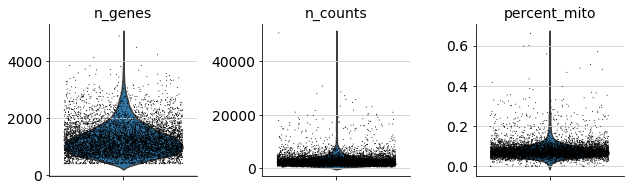

In [26]:

adata.var_names_make_unique()

mito_genes = [name for name in adata.var_names if name in ['ND1','ND2','ND4L','ND4','ND5','ND6','ATP6','ATP8','CYTB','COX1','COX2','COX3'] or 'MT-' in name]
ribo_genes = [name for name in adata.var_names if name.startswith('RPS') or name.startswith('RPL') ]

adata.obs['percent_mito'] = np.sum(
    adata[:, mito_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
adata.obs['percent_ribo'] = np.sum(
    adata[:, ribo_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
# add the total counts per cell as observations-annotation to adata
adata.obs['n_counts'] = adata.X.sum(axis=1).A1
#scanpy.api.pp.filter_genes_dispersion(adata,n_top_genes=np.sum(np.sum(adata.X, axis=0)>0))
sc.pp.filter_genes(adata, min_cells=20,inplace=True)
sc.pp.filter_cells(adata,min_genes=400)
sc.pl.violin(adata, ['n_genes', 'n_counts', 'percent_mito'],
             jitter=0.4, multi_panel=True)




In [27]:
def tp_format_macaque(name):
    if isinstance(name, str):
        searched=re.search("E[0-9]+",name)
        if searched is None:
            return('nan')
        tp=re.sub("^E","",searched.group(0))
        tp=float(tp)
        return(tp)
    else:
        return('nan')

def region_format_macaque(name):
    if isinstance(name, str):
        region=re.sub('E[0-9]+',"",name)
        region=re.sub("^_","",region)
        if '_' not in name:
            return('nan')
        spl=region.split('_')
        if len(spl) < 1:
            return('nan')
        region=spl[len(spl)-1]
    else:
        region='nan'
    return(region)

adata.obs.insert(0, 'simpleregion',[re.sub('_','',x[x.rfind('_'):]) if '_' in x else x for x in adata.obs['region']])
adata.obs.insert(0, 'tp',[tp_format_macaque(x) for x in adata.obs['region']])
adata.obs.insert(0, 'ActualRegion',[region_format_macaque(x) for x in adata.obs['region']])


nan
E65_A_LGE
E65
E65_A_Somato
E65
E65_A_Thal
E65
E65_B_Parietal
E65
E65_B_Parietal
E65
E65_B_Hippocampus
E65
E65_B_Motor-1
E65
E65_A_LGE
E65
E65_B_V1
E65
E65_A_V1
E65
E65_B_MGE
E65
E65_A_Somato
E65
E65_A_Motor-1
E65
E65_B_PFC
E65
E65_B_Motor-1
E65
E65_A_Parietal
E65
E65_B_Cerebellum
E65
Doublet
E65_A_Somato
E65
E65_B_Motor-2
E65
E65_B_Motor-1
E65
Doublet
E65_A_Temporal
E65
Doublet
E65_B_Motor-2
E65
Doublet
E65_A_LGE
E65
E65_A_Temporal
E65
E65_A_Motor-1
E65
E65_B_Cerebellum
E65
E65_B_Motor-2
E65
E65_B_PFC
E65
E65_B_Somato
E65
E65_B_Motor-2
E65
E65_A_CGE
E65
E65_B_Cerebellum
E65
E65_A_V1
E65
E65_A_PFC
E65
E65_B_Motor-2
E65
E65_A_Temporal
E65
E65_B_Motor-2
E65
E65_B_V1
E65
E65_A_Choroid
E65
E65_A_Somato
E65
E65_A_CGE
E65
E65_A_PFC
E65
E65_B_Choroid
E65
E65_A_V1
E65
E65_B_Temporal
E65
E65_B_Motor-2
E65
Negative
E65_B_MGE
E65
E65_A_V1
E65
Doublet
E65_A_Hypo
E65
E65_B_Motor-1
E65
E65_B_MGE
E65
E65_A_V1
E65
E65_B_LGE
E65
E65_A_LGE
E65
E65_A_LGE
E65
Negative
E65_B_Motor-2
E65
E65_A_V1
E65
E65

E65_A_Somato
E65
E65_A_CGE
E65
E65_A_Thal
E65
E65_B_Motor-1
E65
E65_B_Cerebellum
E65
E65_A_PFC
E65
E65_A_CGE
E65
E65_B_MGE
E65
Negative
E65_A_Hippocampus
E65
E65_B_PFC
E65
E65_A_V1
E65
E65_B_Parietal
E65
Negative
Negative
E65_A_Hypo
E65
E65_B_Motor-1
E65
Doublet
E65_B_PFC
E65
Doublet
Negative
E65_B_Motor-1
E65
E65_A_Somato
E65
Doublet
E65_A_Thal
E65
E65_A_V1
E65
E65_B_Motor-2
E65
E65_B_Motor-2
E65
Negative
Negative
E65_B_Motor-2
E65
E65_B_Motor-2
E65
E65_A_V1
E65
E65_B_V1
E65
Negative
E65_B_PFC
E65
E65_B_PFC
E65
E65_B_MGE
E65
Doublet
E65_B_Temporal
E65
E65_A_LGE
E65
E65_A_Temporal
E65
E65_A_Temporal
E65
E65_A_Midbrain
E65
E65_A_PFC
E65
Doublet
E65_A_Motor-2
E65
E65_A_CGE
E65
Negative
E65_A_Midbrain
E65
Negative
E65_B_Motor-2
E65
E65_A_Somato
E65
E65_B_Motor-2
E65
E65_A_Parietal
E65
E65_B_Motor-2
E65
E65_A_Hippocampus
E65
Negative
E65_A_Motor-1
E65
Negative
E65_B_Motor-2
E65
E65_A_Somato
E65
E65_A_PFC
E65
E65_A_Somato
E65
Doublet
E65_A_Thal
E65
E65_B_PFC
E65
E65_A_CGE
E65
E65_A_PFC
E65


E65_B_Motor-2
E65
E65_B_Motor-1
E65
E65_B_Motor-2
E65
E65_A_Pons
E65
E65_A_Pons
E65
E65_A_CGE
E65
E65_A_Hippocampus
E65
E65_A_Temporal
E65
E65_A_Temporal
E65
Negative
E65_A_Choroid
E65
E65_B_Motor-2
E65
E65_A_Temporal
E65
Negative
Negative
E65_A_CGE
E65
E65_A_Parietal
E65
E65_B_Motor-1
E65
E65_A_V1
E65
E65_A_Temporal
E65
E65_B_Choroid
E65
E65_B_Motor-2
E65
E65_A_V1
E65
E65_A_MGE
E65
E65_B_Motor-2
E65
E65_A_Temporal
E65
E65_A_Midbrain
E65
E65_A_PFC
E65
E65_A_CGE
E65
E65_A_Temporal
E65
E65_A_Hippocampus
E65
E65_B_Thalamus
E65
E65_B_Hippocampus
E65
E65_B_Motor-2
E65
E65_B_Temporal
E65
E65_A_CGE
E65
Negative
Doublet
E65_A_MGE
E65
E65_B_Motor-1
E65
Negative
E65_A_Thal
E65
E65_B_Thalamus
E65
E65_B_Motor-2
E65
E65_A_Thal
E65
E65_B_Somato
E65
E65_A_Midbrain
E65
E65_B_PFC
E65
E65_B_Motor-2
E65
E65_A_CGE
E65
E65_A_V1
E65
E65_B_Somato
E65
E65_A_Parietal
E65
E65_A_CGE
E65
E65_A_MGE
E65
E65_B_MGE
E65
E65_B_PFC
E65
E65_B_MGE
E65
E65_A_LGE
E65
E65_B_Somato
E65
Doublet
E65_A_Somato
E65
E65_B_Motor-2
E

Negative
Negative
Negative
Negative
E65_A_Midbrain
E65
Negative
E65_B_Parietal
E65
Negative
Negative
Negative
Negative
Negative
E65_A_Temporal
E65
Negative
Negative
Negative
E65_B_Cerebellum
E65
E65_B_MGE
E65
Negative
E65_A_Somato
E65
Negative
Negative
Negative
Negative
Negative
Negative
Negative
Negative
Negative
Negative
Negative
Negative
Negative
Negative
Negative
Negative
Negative
Negative
Negative
Negative
Negative
Negative
Negative
Negative
Negative
Negative
Negative
Negative
Negative
Negative
Negative
Negative
Negative
Negative
E65_A_Motor-1
E65
Negative
Negative
Negative
Negative
Negative
E65_B_Parietal
E65
Negative
E65_A_Temporal
E65
E65_A_LGE
E65
Negative
E65_B_Choroid
E65
E65_A_Parietal
E65
E65_A_PFC
E65
Negative
E65_B_Somato
E65
E65_A_PFC
E65
Negative
E65_A_Motor-1
E65
Negative
E65_B_Motor-2
E65
Negative
E65_B_Parietal
E65
E65_A_Hypo
E65
Negative
E65_B_Temporal
E65
E65_A_Thal
E65
E65_B_Motor-2
E65
Doublet
E65_B_Parietal
E65
Negative
Negative
Negative
Negative
Negative
Negat

In [23]:
adata.obs

,ActualRegion,tp,simpleregion,region,percent_mito,percent_ribo,n_counts,n_genes
AAACCCAGTACCCAGC,nan,nan,nan,nan,0.035250,0.153370,1617.0,820
AAACCCAGTACGAGCA,LGE,65,LGE,E65_A_LGE,0.050774,0.146749,1615.0,826
AAACCCAGTACTAAGA,Somato,65,Somato,E65_A_Somato,0.042857,0.120000,1400.0,791
AAACCCATCAAAGAAC,Thal,65,Thal,E65_A_Thal,0.073302,0.056490,2974.0,1488
AAACCCATCTTCTGGC,Parietal,65,Parietal,E65_B_Parietal,0.069971,0.156463,2058.0,1011
AAACGAAAGAGCTGCA,Parietal,65,Parietal,E65_B_Parietal,0.118197,0.119898,2352.0,1087
AAACGAAAGCTGCCTG,Hippocampus,65,Hippocampus,E65_B_Hippocampus,0.188178,0.010493,2859.0,873
AAACGAACACGGCGTT,Motor-1,65,Motor-1,E65_B_Motor-1,0.088769,0.142569,1487.0,751
AAACGAACACTGGCCA,LGE,65,LGE,E65_A_LGE,0.057993,0.131488,7225.0,2399
AAACGAAGTTGCGTAT,V1,65,V1,E65_B_V1,0.094488,0.105996,1651.0,868


In [18]:
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)

sc.pp.log1p(adata)

sc.pp.highly_variable_genes(adata, n_top_genes=3000)
sc.pp.scale(adata, max_value=10)
#sc.pp.regress_out(adata,'n_counts')


--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [19]:
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata)

Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.
computing PCA with n_comps = 50
computing PCA on highly variable genes
    finished (0:00:00.77)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:01.80) --> added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix
computing UMAP
    using 'X_pca' with n_pcs = 50


/home/mt/code/utils/miniconda3/lib/python3.6/site-packages/umap/spectral.py:229: UserWarning:

Embedding a total of 2 separate connected components using meta-embedding (experimental)



    finished (0:00:11.59) --> added
    'X_umap', UMAP coordinates (adata.obsm)
running Leiden clustering
    finished (0:00:01.76) --> found 23 clusters and added
    'leiden', the cluster labels (adata.obs, categorical)


calculating cell cycle phase
computing score 'S_score'
    finished (0:00:01.71) --> added
    'S_score', score of gene set (adata.obs)
computing score 'G2M_score'


... storing 'phase' as categorical


    finished (0:00:01.64) --> added
    'G2M_score', score of gene set (adata.obs)
-->     'phase', cell cycle phase (adata.obs)


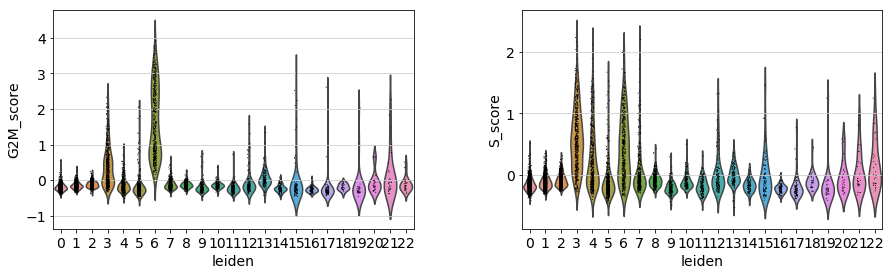

saving figure to file ./figures/umap_cc.pdf


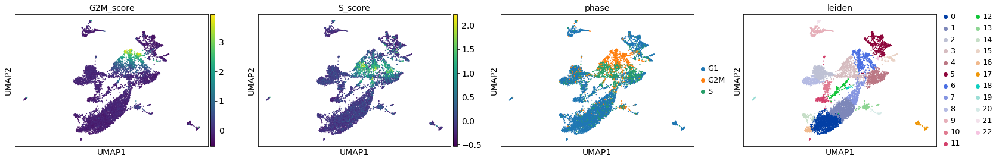

AnnData object with n_obs × n_vars = 6906 × 12507 
    obs: 'region', 'percent_mito', 'percent_ribo', 'n_counts', 'n_genes', 'leiden', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'pca', 'neighbors', 'leiden', 'phase_colors', 'leiden_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

In [20]:
def cell_cycle_score(adata,save=False):
    s_genes=['MCM5', 'PCNA', 'TYMS', 'FEN1', 'MCM2', 'MCM4', 'RRM1', 'UNG', 'GINS2', 'MCM6', 'CDCA7', 'DTL', 'PRIM1', 'UHRF1', 'MLF1IP', 'HELLS', 'RFC2', 'RPA2', 'NASP', 'RAD51AP1', 'GMNN', 'WDR76', 'SLBP', 'CCNE2', 'UBR7', 'POLD3', 'MSH2', 'ATAD2', 'RAD51', 'RRM2', 'CDC45', 'CDC6', 'EXO1', 'TIPIN', 'DSCC1', 'BLM', 'CASP8AP2', 'USP1', 'CLSPN', 'POLA1', 'CHAF1B', 'BRIP1', 'E2F8']
    g2m_genes=['HMGB2', 'CDK1', 'NUSAP1', 'UBE2C', 'BIRC5', 'TPX2', 'TOP2A', 'NDC80', 'CKS2', 'NUF2', 'CKS1B', 'MKI67', 'TMPO', 'CENPF', 'TACC3', 'FAM64A', 'SMC4', 'CCNB2', 'CKAP2L', 'CKAP2', 'AURKB', 'BUB1', 'KIF11', 'ANP32E', 'TUBB4B', 'GTSE1', 'KIF20B', 'HJURP', 'CDCA3', 'HN1', 'CDC20', 'TTK', 'CDC25C', 'KIF2C', 'RANGAP1', 'NCAPD2', 'DLGAP5', 'CDCA2', 'CDCA8', 'ECT2', 'KIF23', 'HMMR', 'AURKA', 'PSRC1', 'ANLN', 'LBR', 'CKAP5', 'CENPE', 'CTCF', 'NEK2', 'G2E3', 'GAS2L3', 'CBX5', 'CENPA']
    sc.tl.score_genes_cell_cycle(adata,s_genes=s_genes,g2m_genes=g2m_genes)
    sc.pl.violin(adata, ['G2M_score','S_score'], groupby='leiden')
    if 'X_tsne' in adata.obsm.keys(): 
        sc.pl.tsne(adata, color=['G2M_score','S_score','phase','leiden'],save='_cc')
    sc.pl.umap(adata, color=['G2M_score','S_score','phase','leiden'],save='_cc')
    return(adata)
cell_cycle_score(adata)

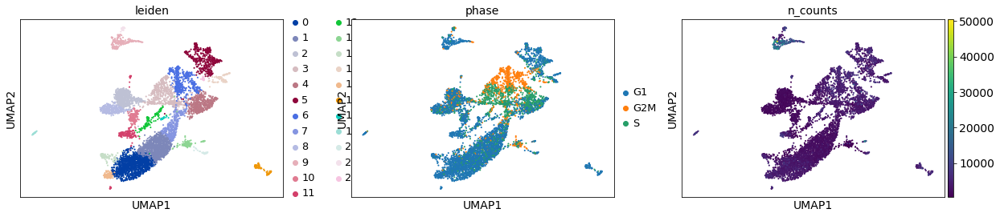

In [21]:


sc.pl.umap(adata, color=['leiden','phase','n_counts'])


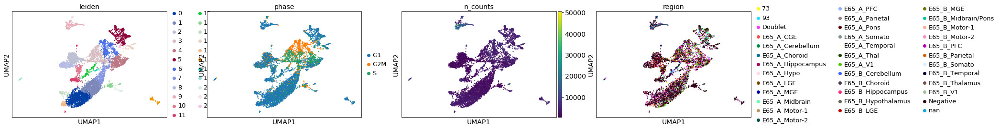

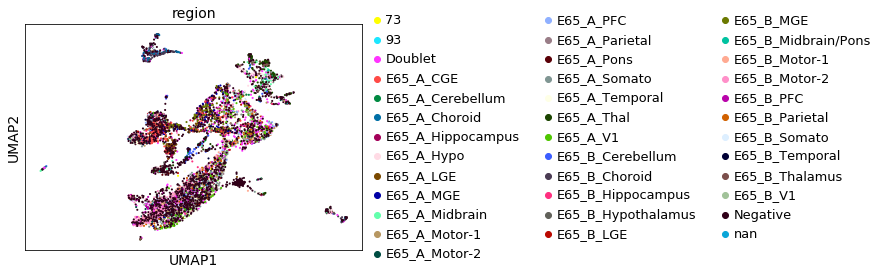

In [22]:
sc.pl.umap(adata, color=['leiden','phase','n_counts','region'])
sc.pl.umap(adata, color=['region'])


In [ ]:
sampleDirs=dict(zip(sampletable.keys(),['E65-2019A_AND_E65-2019B_MULTI-SEQ_1_Out',
                                        'E65-2019A_AND_E65-2019B_MULTI-SEQ_2_Out',
                                        'E65-2019A_AND_E65-2019B_MULTI-SEQ_3_Out',
                                        'E80-2019_MULTI-SEQ_Out',
                                       'E90-2019_MULTI-SEQ_Out']))

In [19]:
adatas=[]
for s in sampletable.keys():
    adata = sc.read_10x_mtx('/home/mt/Downloads/macaque2final/'+sampleDirs[s]+'/outs/filtered_feature_bc_matrix',cache=True)
    adata.obs.index=[re.sub("-1","",x) for x in adata.obs.index]
    sampletable[s].columns=['region']
    adata.obs.insert(0,'region',sampletable[s].loc[adata.obs.index,'region'])
    adatas.append(adata)
    


... reading from cache file /home/mt/Downloads/macaquecache/home-mt-Downloads-macaque2final-E65-2019A_AND_E65-2019B_MULTI-SEQ_1_Out-outs-filtered_feature_bc_matrix-matrix.h5ad


/home/mt/code/utils/miniconda3/lib/python3.6/site-packages/pandas/core/indexing.py:1017: FutureWarning:


Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike



... reading from cache file /home/mt/Downloads/macaquecache/home-mt-Downloads-macaque2final-E65-2019A_AND_E65-2019B_MULTI-SEQ_2_Out-outs-filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file /home/mt/Downloads/macaquecache/home-mt-Downloads-macaque2final-E65-2019A_AND_E65-2019B_MULTI-SEQ_3_Out-outs-filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file /home/mt/Downloads/macaquecache/home-mt-Downloads-macaque2final-E80-2019_MULTI-SEQ_Out-outs-filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file /home/mt/Downloads/macaquecache/home-mt-Downloads-macaque2final-E90-2019_MULTI-SEQ_Out-outs-filtered_feature_bc_matrix-matrix.h5ad


In [20]:
adata=anndata.AnnData.concatenate(*adatas)

filtered out 14041 genes that are detected in less than 20 cells
filtered out 2793 cells that have less than 400 genes expressed


... storing 'region' as categorical
... storing 'feature_types-0' as categorical
... storing 'feature_types-1' as categorical
... storing 'feature_types-2' as categorical
... storing 'feature_types-3' as categorical
... storing 'feature_types-4' as categorical


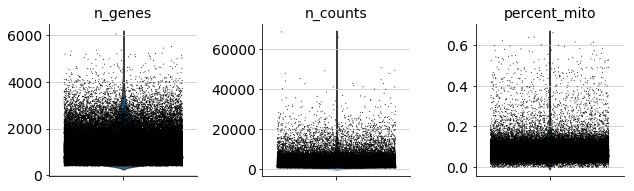

--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.
computing PCA with n_comps = 50
computing PCA on highly variable genes
    finished (0:00:12.74)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:26.97) --> added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix
computing UMAP
    using 'X_pca' with n_pcs = 50
    finished (0:00:58.56) --> added
    'X_umap', UMAP coordinates (adata.obsm)
running Leiden clustering
    finished (0:00:35.94) --> found 34 clusters and added
    'leiden', the cluster labels (adata.obs, categori

In [21]:
adata.var_names_make_unique()

mito_genes = [name for name in adata.var_names if name in ['ND1','ND2','ND4L','ND4','ND5','ND6','ATP6','ATP8','CYTB','COX1','COX2','COX3'] or 'MT-' in name]
ribo_genes = [name for name in adata.var_names if name.startswith('RPS') or name.startswith('RPL') ]

adata.obs['percent_mito'] = np.sum(
    adata[:, mito_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
adata.obs['percent_ribo'] = np.sum(
    adata[:, ribo_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
# add the total counts per cell as observations-annotation to adata
adata.obs['n_counts'] = adata.X.sum(axis=1).A1
#scanpy.api.pp.filter_genes_dispersion(adata,n_top_genes=np.sum(np.sum(adata.X, axis=0)>0))
sc.pp.filter_genes(adata, min_cells=20,inplace=True)
sc.pp.filter_cells(adata,min_genes=400)
sc.pl.violin(adata, ['n_genes', 'n_counts', 'percent_mito'],
             jitter=0.4, multi_panel=True)

sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)

sc.pp.log1p(adata)

sc.pp.highly_variable_genes(adata, n_top_genes=3000)
sc.pp.scale(adata, max_value=10)
#sc.pp.regress_out(adata,'n_counts')

sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata)

... storing 'simpleregion' as categorical


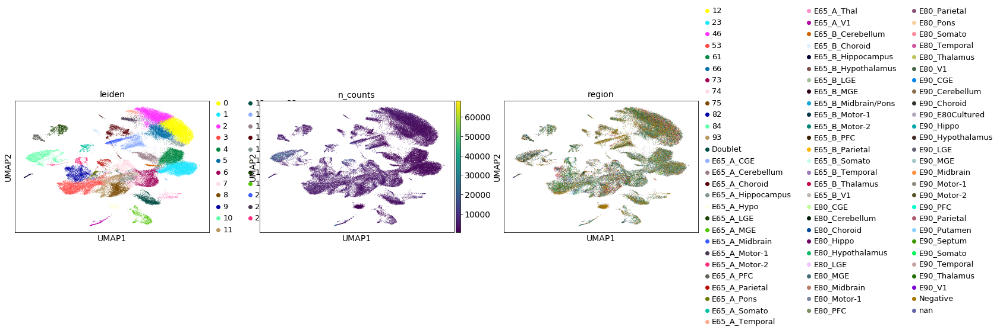

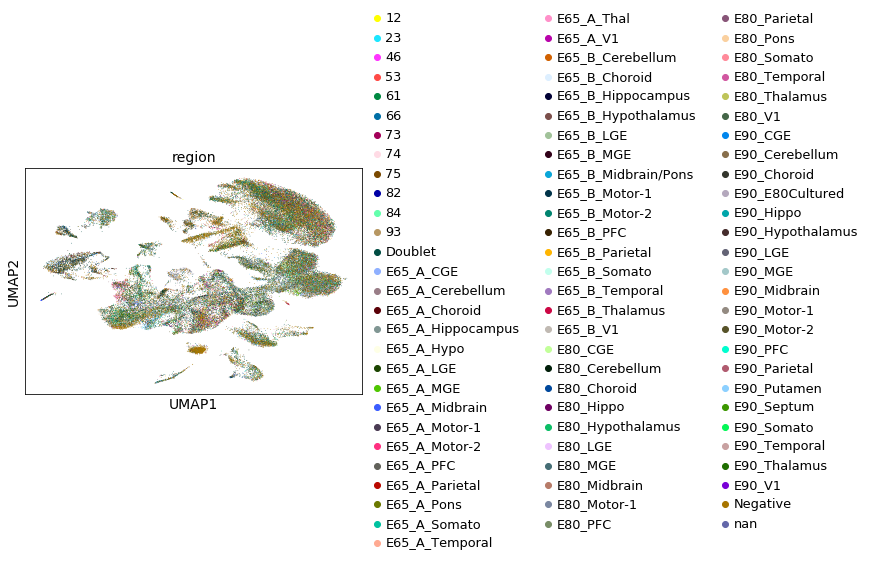

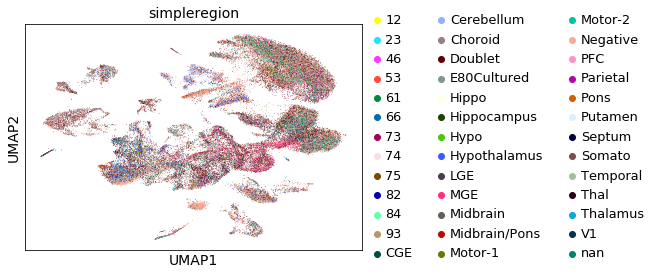

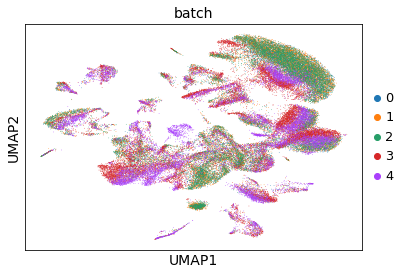

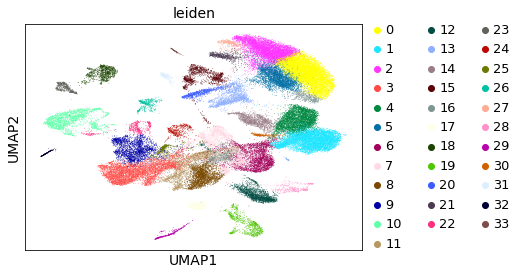

In [27]:
#cell_cycle_score(adata)
sc.pl.umap(adata, color=['leiden','n_counts','region'])
sc.pl.umap(adata[[],:], color=['region'])
sc.pl.umap(adata, color=['simpleregion'])
sc.pl.umap(adata, color=['batch'])
sc.pl.umap(adata, color=['leiden'])



In [23]:
sc.tl.rank_genes_groups(adata, 'leiden', method='logreg')
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
df=pd.DataFrame({group + '_' + key[:1]: result[key][group] for group in groups for key in ['names', 'scores']})
df.to_csv(os.path.join(sc.settings.figdir,"leidenLogRegMarkers.csv"))


ranking genes


/home/mt/code/utils/miniconda3/lib/python3.6/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning:

Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.



MemoryError: 

In [24]:
adata.obs.insert(0, 'simpleregion',[re.sub('_','',x[x.rfind('_'):]) if '_' in x else x for x in adata.obs['region']])


In [28]:
Counter(adata.obs['region'])

Counter({'nan': 5,
         'E65_A_LGE': 627,
         'E65_A_Somato': 980,
         'E65_A_Thal': 534,
         'E65_B_Parietal': 884,
         'E65_B_Hippocampus': 219,
         'E65_B_Motor-1': 595,
         'E65_B_V1': 537,
         'E65_A_V1': 1121,
         'E65_B_MGE': 664,
         'E65_A_Motor-1': 649,
         'E65_B_PFC': 652,
         'E65_A_Parietal': 456,
         'E65_B_Cerebellum': 309,
         'Doublet': 14593,
         'E65_B_Motor-2': 1952,
         'E65_A_Temporal': 1394,
         'E65_B_Somato': 590,
         'E65_A_CGE': 1095,
         'E65_A_PFC': 593,
         'E65_A_Choroid': 294,
         'E65_B_Choroid': 459,
         'E65_B_Temporal': 407,
         'Negative': 18780,
         'E65_A_Hypo': 577,
         'E65_B_LGE': 197,
         'E65_B_Hypothalamus': 51,
         'E65_A_MGE': 436,
         '93': 3,
         'E65_B_Thalamus': 290,
         'E65_A_Hippocampus': 378,
         'E65_A_Cerebellum': 496,
         'E65_A_Midbrain': 374,
         'E65_A_Motor-2': 3

0
0
[['Protoplasmic']]
['Protoplasmic']
1
0
[['nan']]
['nan']
2
0
[['nan']]
['nan']
3
0
[['nan']]
['nan']
4
0
[['Blood vessel-associated'], ['']]
['Blood vessel-associated']
4
1
[['Blood vessel-associated'], ['']]
['']
5
0
[[''], ['Layer 1', 'Layer 2']]
['']
5
1
[[''], ['Layer 1', 'Layer 2']]
['Layer 1', 'Layer 2']
6
0
[['nan']]
['nan']
7
0
[['nan']]
['nan']
8
0
[['nan']]
['nan']
9
0
[['nan']]
['nan']
10
0
[['nan']]
['nan']
11
0
[['Migrating']]
['Migrating']
12
0
[['nan']]
['nan']
13
0
[['nan']]
['nan']
14
0
[['nan']]
['nan']
15
0
[['nan']]
['nan']
16
0
[['nan']]
['nan']
17
0
[['nan']]
['nan']
18
0
[['nan']]
['nan']
19
0
[['nan']]
['nan']
20
0
[['Reactive']]
['Reactive']
21
0
[['Resting']]
['Resting']
22
0
[['nan']]
['nan']
23
0
[[''], ['Layer 2', 'Layer 3']]
['']
23
1
[[''], ['Layer 2', 'Layer 3']]
['Layer 2', 'Layer 3']
24
0
[['Migration pausing', 'Interneuron']]
['Migration pausing', 'Interneuron']
25
0
[['Parvalbumin', 'Interneuron']]
['Parvalbumin', 'Interneuron']
26
0
[['Somatost

Neurectoderm
3
computing score 'Neurectoderm'
    finished (0:00:00.80) --> added
    'Neurectoderm', score of gene set (adata.obs)
migrating Neuron
2
computing score 'migrating Neuron'
    finished (0:00:00.77) --> added
    'migrating Neuron', score of gene set (adata.obs)
Microglia
4
computing score 'Microglia'
    finished (0:00:00.79) --> added
    'Microglia', score of gene set (adata.obs)
Layer 2 Neuron
5
computing score 'Layer 2 Neuron'
    finished (0:00:00.75) --> added
    'Layer 2 Neuron', score of gene set (adata.obs)
G2 Phase Proliferating Cell
47
computing score 'G2 Phase Proliferating Cell'
    finished (0:00:00.85) --> added
    'G2 Phase Proliferating Cell', score of gene set (adata.obs)
Layer 1 Astrocyte
2
computing score 'Layer 1 Astrocyte'
    finished (0:00:00.75) --> added
    'Layer 1 Astrocyte', score of gene set (adata.obs)
Layer 5 Neuron
4
computing score 'Layer 5 Neuron'
    finished (0:00:00.70) --> added
    'Layer 5 Neuron', score of gene set (adata.obs)


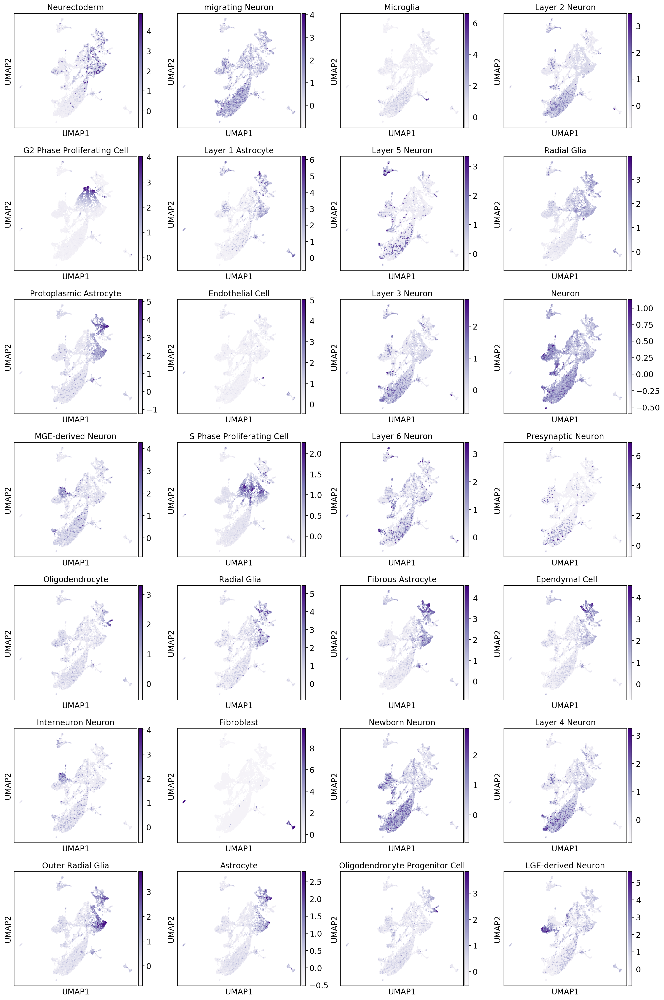

defaultdict(<class 'list'>, {'post-mitotic Neuron': ['SOX5'], 'Reactive Microglia': ['AIF1'], 'Neurectoderm': ['PAX6', 'NOTCH1', 'NR2E1'], 'migrating Neuron': ['CCDC115', 'SOX5'], 'Microglia': ['LAMP1', 'FOLR2', 'SLA', 'PLEK'], ' Astrocyte': ['GFAP'], 'Layer 2 Neuron': ['SATB2', 'CUX2', 'CALB1', 'RASGRF2', 'LHX2'], 'Layer 2  Neuron': ['POU3F2'], 'G2 Phase Proliferating Cell': ['CDK1', 'NUSAP1', 'BIRC5', 'TPX2', 'TOP2A', 'NDC80', 'NUF2', 'TMPO', 'CENPF', 'TACC3', 'SMC4', 'CCNB2', 'CKAP2L', 'CKAP2', 'AURKB', 'BUB1', 'KIF11', 'ANP32E', 'TUBB4B', 'GTSE1', 'KIF20B', 'HJURP', 'CDCA3', 'CDC20', 'TTK', 'CDC25C', 'KIF2C', 'RANGAP1', 'NCAPD2', 'DLGAP5', 'CDCA2', 'CDCA8', 'ECT2', 'KIF23', 'HMMR', 'AURKA', 'PSRC1', 'ANLN', 'LBR', 'CKAP5', 'CENPE', 'CTCF', 'NEK2', 'G2E3', 'GAS2L3', 'CBX5', 'CENPA'], 'Thalamic Neuron': ['TLE4'], 'Postsynaptic Neuron': ['DLG4'], 'Layer 1 Astrocyte': ['CRYAB', 'ID3'], 'Layer 5 Neuron': ['BCL11B', 'TBR1', 'PCP4', 'CNTN6'], 'Radial Glia': ['SOX2', 'NES', 'PROM1', 'HES1'

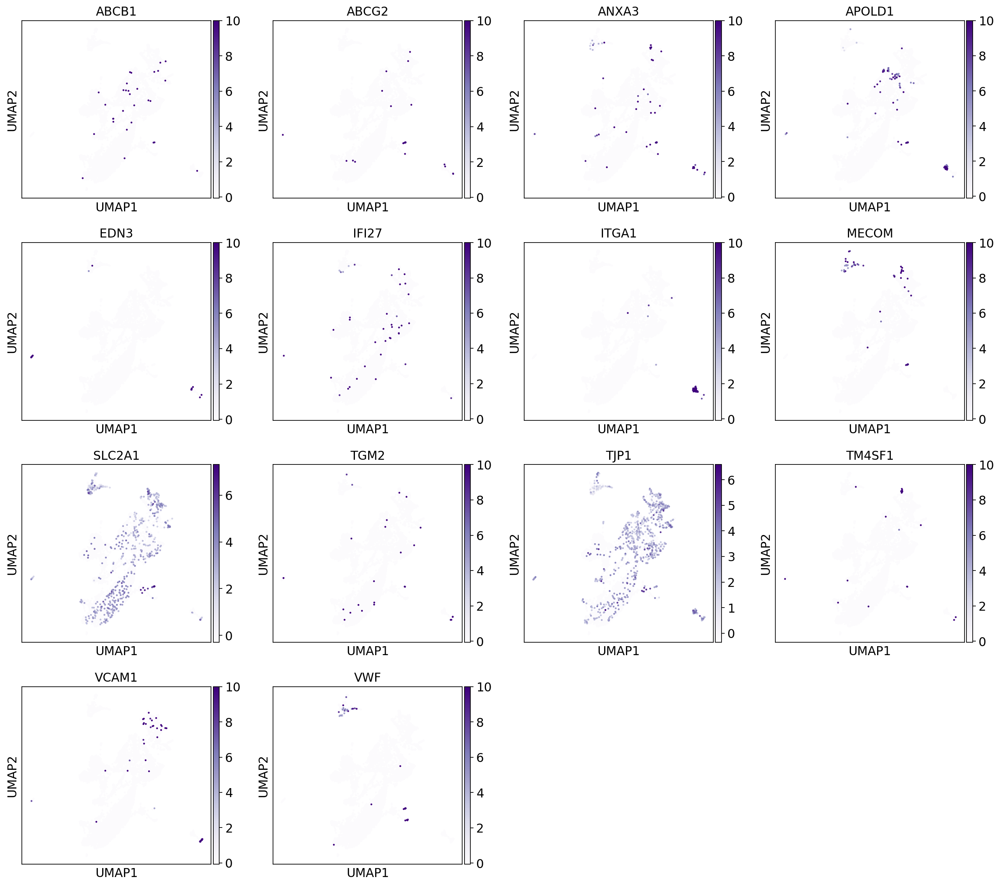

Ependymal Cell
saving figure to file ./figures/umap_Ependymal Cell_Marker.pdf


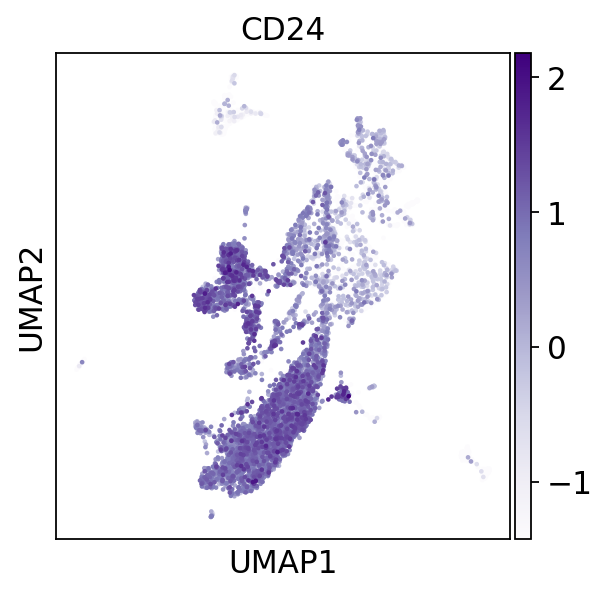

Neurectoderm
saving figure to file ./figures/umap_Neurectoderm_Marker.pdf


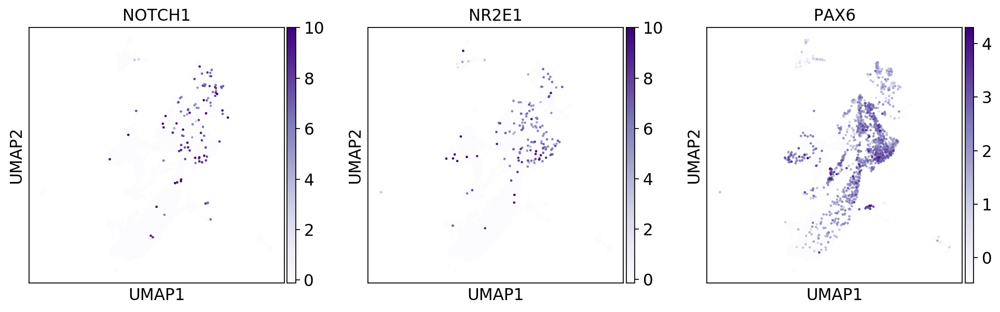

Neuron
saving figure to file ./figures/umap_Neuron_Marker.pdf


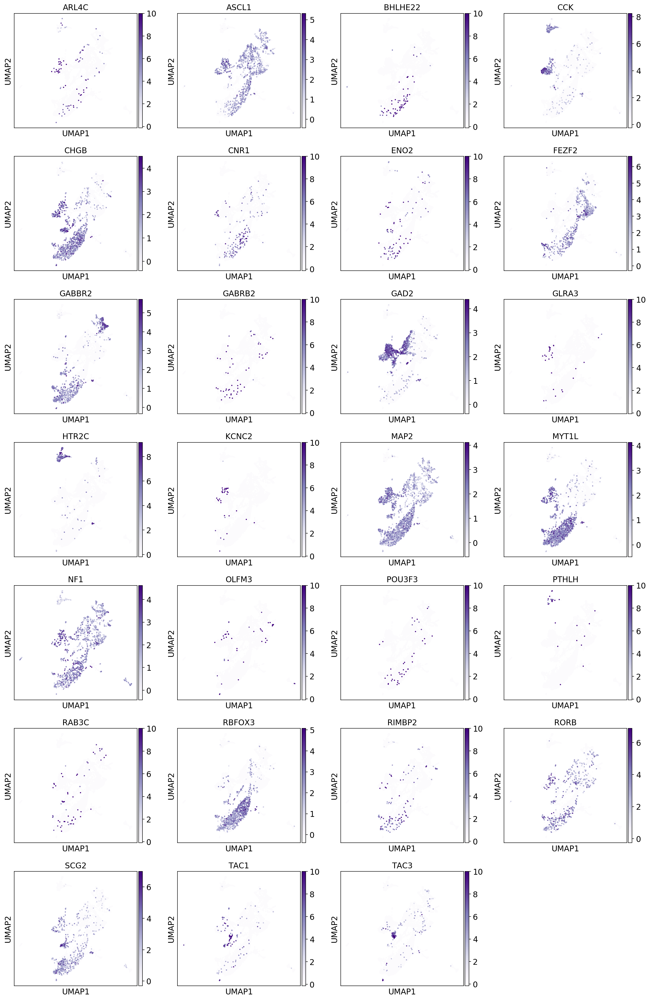

Fibroblast
saving figure to file ./figures/umap_Fibroblast_Marker.pdf


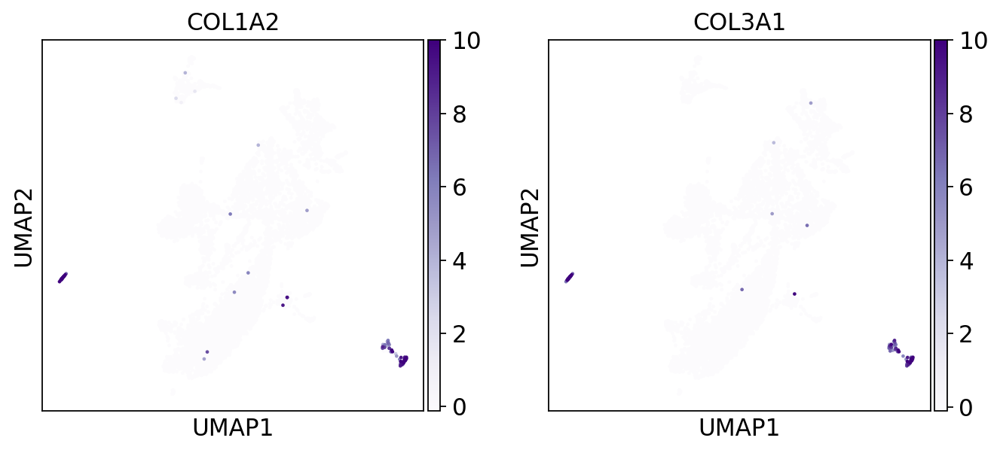

Microglia
saving figure to file ./figures/umap_Microglia_Marker.pdf


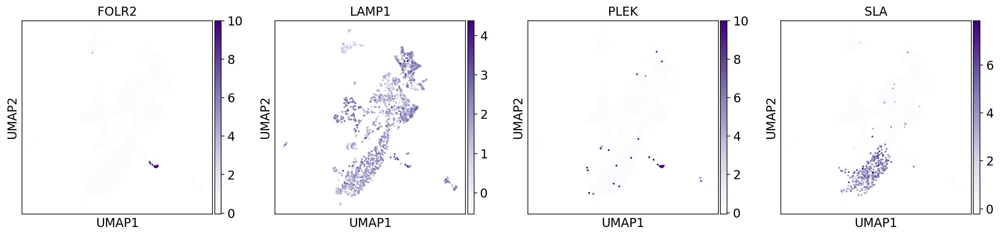

Oligodendrocyte
saving figure to file ./figures/umap_Oligodendrocyte_Marker.pdf


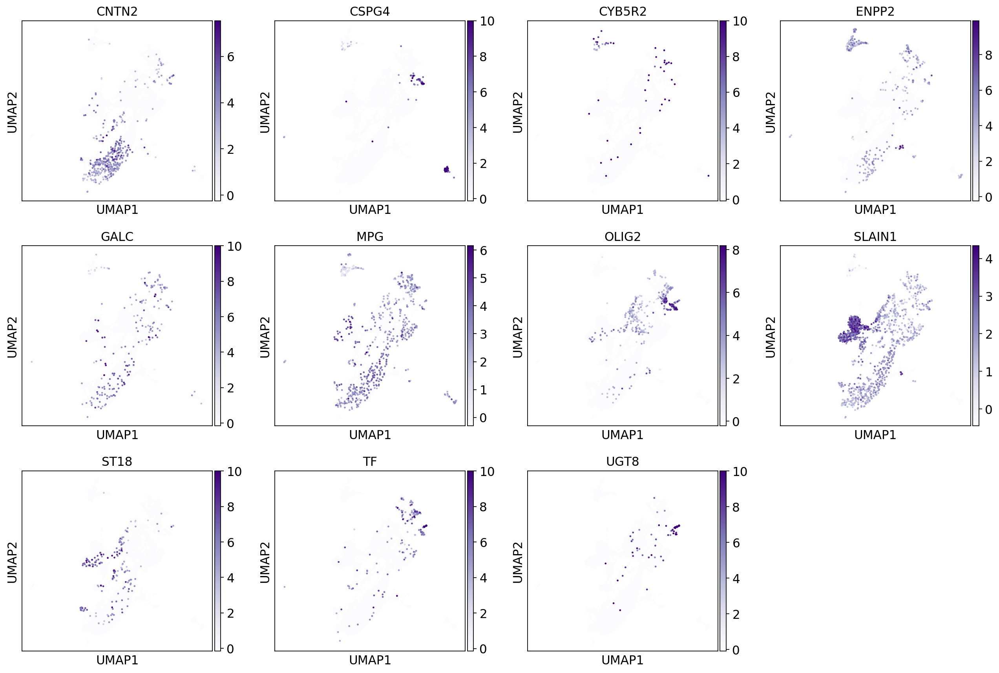

 Astrocyte
saving figure to file ./figures/umap_ Astrocyte_Marker.pdf


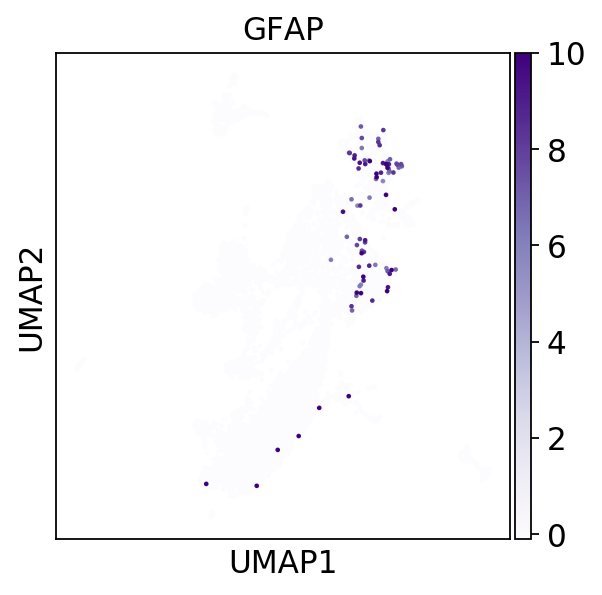

 Neuron
saving figure to file ./figures/umap_ Neuron_Marker.pdf


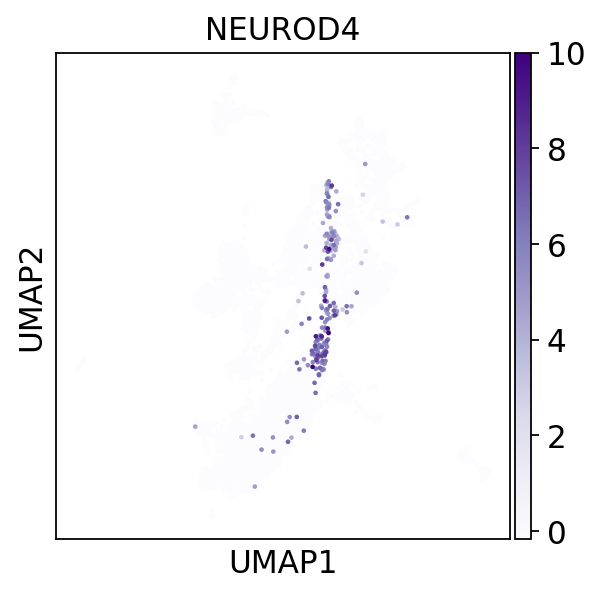

Astrocyte
saving figure to file ./figures/umap_Astrocyte_Marker.pdf


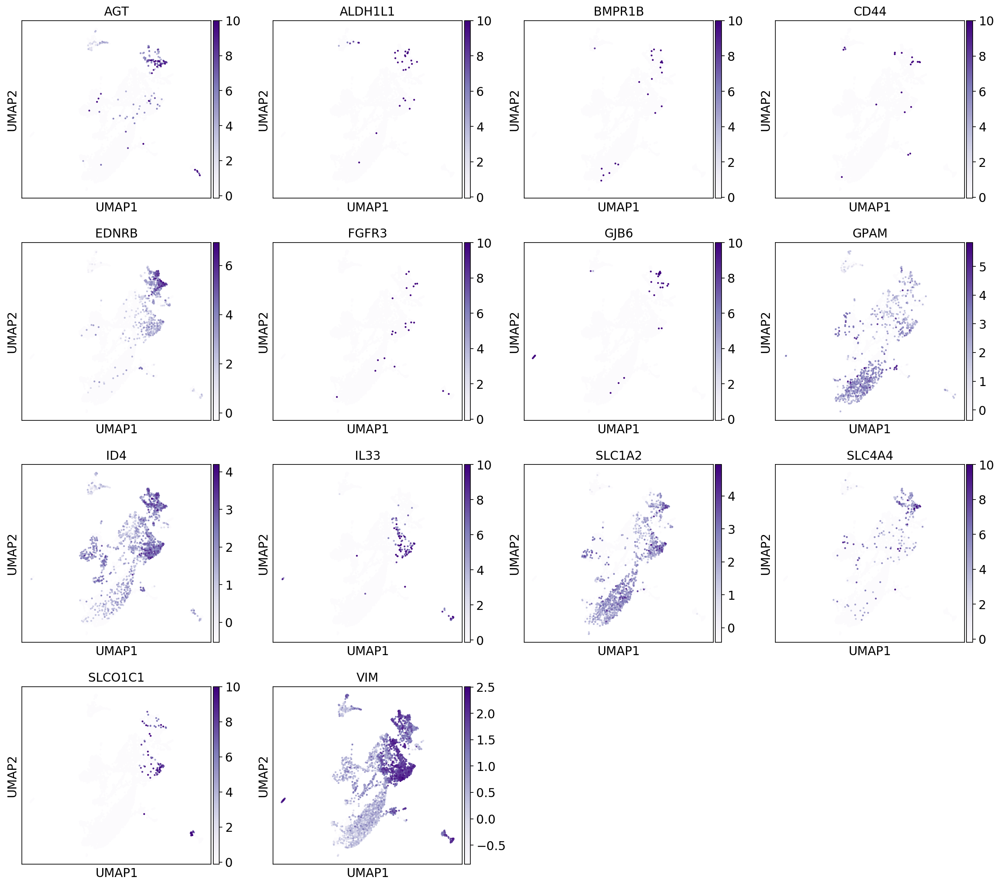

Radial Glia
saving figure to file ./figures/umap_Radial Glia_Marker.pdf


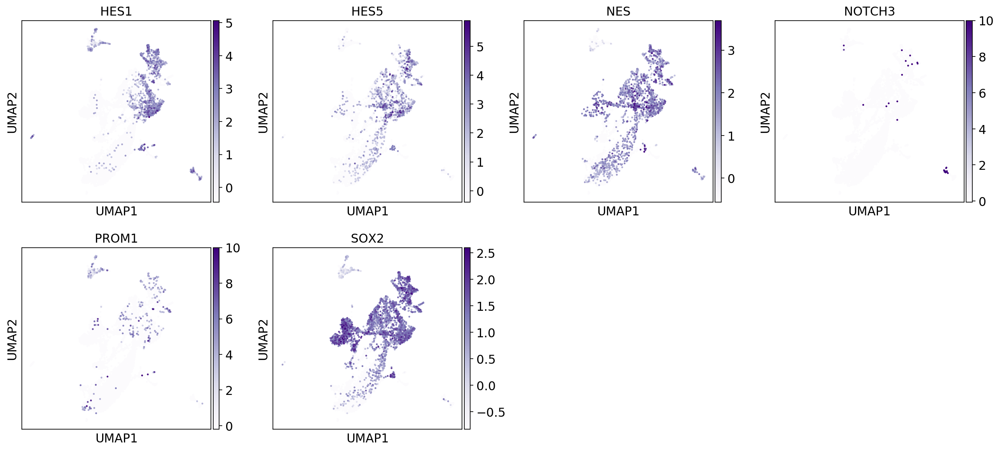

Pericyte
saving figure to file ./figures/umap_Pericyte_Marker.pdf


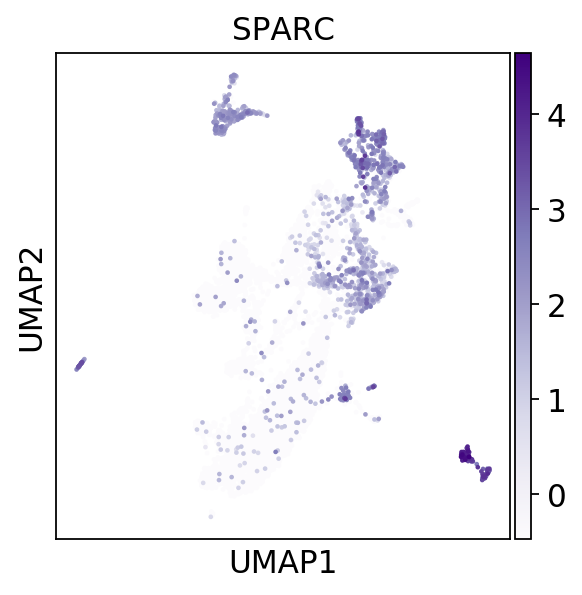

Oligodendrocyte Progenitor Cell
saving figure to file ./figures/umap_Oligodendrocyte Progenitor Cell_Marker.pdf


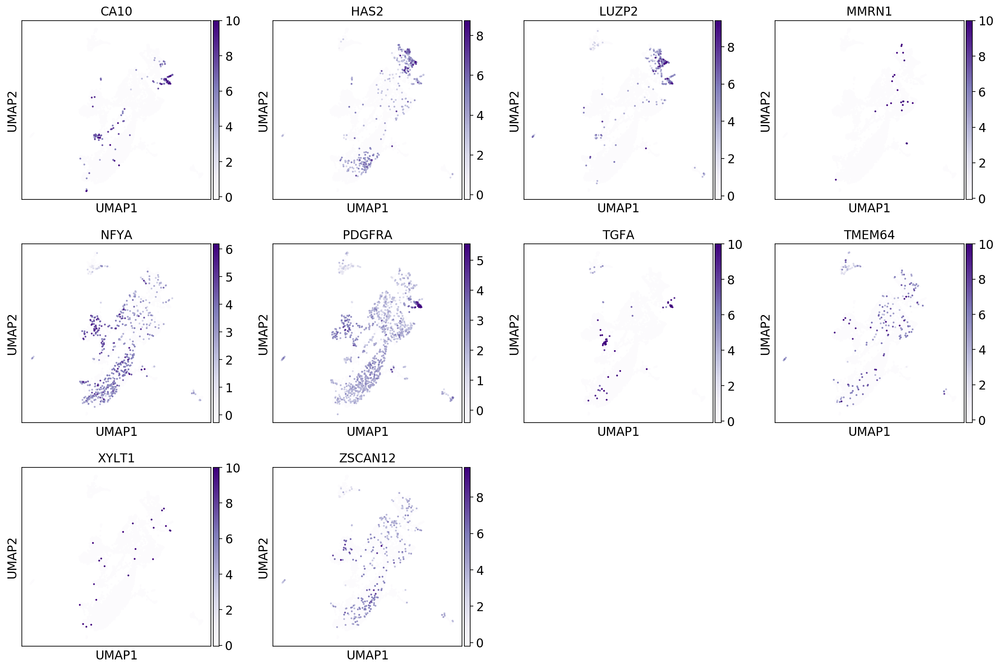

AnnData object with n_obs × n_vars = 6906 × 12507 
    obs: 'region', 'percent_mito', 'percent_ribo', 'n_counts', 'n_genes', 'leiden', 'S_score', 'G2M_score', 'phase', 'Neurectoderm', 'migrating Neuron', 'Microglia', 'Layer 2 Neuron', 'G2 Phase Proliferating Cell', 'Layer 1 Astrocyte', 'Layer 5 Neuron', 'Radial Glia', 'Protoplasmic Astrocyte', 'Endothelial Cell', 'Layer 3 Neuron', 'Neuron', 'MGE-derived Neuron', 'S Phase Proliferating Cell', 'Layer 6 Neuron', 'Presynaptic Neuron', 'Oligodendrocyte', ' Radial Glia', 'Fibrous Astrocyte', ' Ependymal Cell', 'Interneuron Neuron', 'Fibroblast', 'Newborn Neuron', 'Layer 4 Neuron', 'Outer Radial Glia', 'Astrocyte', 'Oligodendrocyte Progenitor Cell', 'LGE-derived Neuron'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'pca', 'neighbors', 'leiden', 'phase_colors', 'leiden_colors', 'region_colors', 'marker_groups'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

In [51]:
def marker_analysis(adata,variables=['leiden','region'],markerpath='https://docs.google.com/spreadsheets/d/e/2PACX-1vTz5a6QncpOOO-f3FHW2Edomn7YM5mOJu4z_y07OE3Q4TzcRr14iZuVyXWHv8rQuejzhhPlEBBH1y0V/pub?gid=1154528422&single=true&output=tsv'):
    sc.set_figure_params(color_map="Purples")
    import random
    markerpath=os.path.expanduser(markerpath)
    markers=pd.read_csv(markerpath,sep="\t",index_col=False)
    markers[markers.keys()[0]]=[str(x) for x in markers[markers.keys()[0]]]
    markers[markers.keys()[2]]=[str(x).split(',') for x in markers[markers.keys()[2]]]
    markers[markers.keys()[3]]=[str(x).split(';') for x in markers[markers.keys()[3]]]
    markers[markers.keys()[3]]=[[str(x).split(',') for x in y] for y in markers[markers.keys()[3]]]
    uniqueClasses=set([y for x in markers[markers.keys()[2]] for y in x if y!='nan'])
    uniqueSubClasses=set([z for x in markers[markers.keys()[3]] for y in x for z in y if z!='nan'])
    comboClasses=[]
    for i in range(markers.shape[0]):
        rowlist=[]
        for j in range(len(markers[markers.keys()[2]][i])):
            print(i)
            print(j)
            print(markers[markers.keys()[3]][i])
            print(markers[markers.keys()[3]][i][j])
            for k in markers[markers.keys()[3]][i][j]:
                rowlist.append(' '.join(filter(lambda x: x != 'nan',[k,markers[markers.keys()[2]][i][j]])))
        comboClasses.append(rowlist)
    markers['fullclass']=comboClasses
    markers.set_index(markers.keys()[0],inplace=True,drop=False)
    markers=markers.loc[ [x for x in markers[markers.keys()[0]] if x in adata.var_names],:]
    uniqueFullClasses=set([y for x in markers['fullclass'] for y in x if y!='nan'])
    from collections import defaultdict
    markerDict = defaultdict(list)

    for x in uniqueFullClasses:
        for y in markers[markers.keys()[0]]:
            if x in markers.loc[y,'fullclass']:
                markerDict[x].append(y)
    markerDictClass = defaultdict(list)
    for x in uniqueClasses:
        for y in markers[markers.keys()[0]]:
            if x in markers.loc[y,'fullclass']:
                markerDictClass[x].append(y)

    markerPlotGroups=[]
    for k in markerDict.keys():
        if len(markerDict[k])>1:
            print(k)
            print(len(markerDict[k]))
            sc.tl.score_genes(adata,gene_list=markerDict[k],score_name=k,gene_pool= markerDict[k]+random.sample(adata.var.index.tolist(),min(4000,adata.var.index.shape[0])))
            markerPlotGroups.append(k)
    adata.uns['marker_groups']=list(markerDict.keys())
    for tag in variables:
        pd.DataFrame(adata.obs.groupby(tag).describe()).to_csv(os.path.join(sc.settings.figdir, tag+"MarkerSumStats.csv"))

    if 'X_tsne' in adata.obsm.keys():
        sc.pl.tsne(adata, color=markerPlotGroups,save="_Marker_Group")
    sc.pl.umap(adata, color=markerPlotGroups,save="_Marker_Group")
    print(markerDict)
    #sc.pl.violin(adata, markerPlotGroups, groupby='leiden',save="_Marker_Group_violins")
    for i in markerDictClass:
        print(i)
        if 'X_tsne' in adata.obsm.keys():
            sc.pl.tsne(adata, color=sorted(markerDictClass[i]),save="_"+str(i)+"_Marker")
        sc.pl.umap(adata, color=sorted(markerDictClass[i]),save="_"+str(i)+"_Marker")
    return(adata)

marker_analysis(adata,variables=['leiden','region'])


In [52]:
markerpath='https://docs.google.com/spreadsheets/d/e/2PACX-1vTz5a6QncpOOO-f3FHW2Edomn7YM5mOJu4z_y07OE3Q4TzcRr14iZuVyXWHv8rQuejzhhPlEBBH1y0V/pub?gid=1154528422&single=true&output=tsv'
markerpath=os.path.expanduser(markerpath)
markers=pd.read_csv(markerpath,sep="\t",index_col=False)


In [53]:
markers

,hgnc_symbol,alias,type,subtype,source
0,AQP4,NaN,Astrocyte,Protoplasmic,Tom
1,CD44,NaN,Astrocyte,NaN,NaN
2,CNP,NaN,Astrocyte,NaN,NaN
3,VIM,NaN,Astrocyte,NaN,NaN
4,S100B,S100β,"Astrocyte,Ependymal Cell",Blood vessel-associated;,NaN
5,RELN,Reelin,"Cahal-Retzius Cell,Neuron",";Layer 1,Layer 2",NaN
6,CALB2,Calretinin,Cahal-Retzius Cell,NaN,NaN
7,TJP1,Zo-1,Endothelial Cell,NaN,NaN
8,SLC2A1,Glut-1,Endothelial Cell,NaN,NaN
9,VCAM1,VCAM-1,Endothelial Cell,NaN,NaN
